# Exploring and mapping the HNOCA

The Human Neural Organoid Cell Atlas (HNOCA) is a continuously expanding collection of single-cell RNA-seq data from human neural organoids. Exploring the dataset will give you a sense of the diversity of cell types present in human brain organoids and mapping to a primary reference uncovers what fraction of human neural diversity can be captured *in vitro*.

In this notebook, we will explore the HNOCA dataset, compute glycolysis scores and show you how to perform query-to-reference to an atlas of the developing human brain ([Braun at al.](https://www.science.org/doi/10.1126/science.adf1226)). First, let's load some libraries and the data.


In [ ]:
import os
import scarches
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import hnoca.map as hmap
import hnoca.stats as stats

os.chdir("/home/fleckj/scratch/hnoca/")

In [8]:
hnoca_adata = sc.read("HNOCA_hv2k.h5ad")
print(hnoca_adata)

AnnData object with n_obs × n_vars = 1770578 × 2000
    obs: 'assay_sc', 'assay_differentiation', 'assay_type_differentiation', 'bio_sample', 'cell_line', 'cell_type', 'development_stage', 'disease', 'ethnicity', 'gm', 'id', 'individual', 'organ', 'organism', 'sex', 'state_exact', 'sample_source', 'source_doi', 'suspension_type_original', 'tech_sample', 'treatment', 'assay_sc_original', 'cell_line_original', 'cell_type_original', 'development_stage_original', 'disease_original', 'ethnicity_original', 'organ_original', 'organism_original', 'sex_original', 'suspension_type', 'obs_names_original', 'organoid_age_days', 'publication', 'doi', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'leiden_pca_unintegrated_1', 'leiden_pca_unintegrated_80', 'leiden_pca_rss_1', 'leiden_pca_rss_80', 'snapseed_pca_unintegrated_level_1', 'snapseed_pca_unintegrated_level_2', 'snapseed_pca_unintegrate

The most common and straight forward thing to check on a single-cell dataset is to explore gene expression patterns. For instance, we can plot the expression of some marker genes on a UMAP embedding.

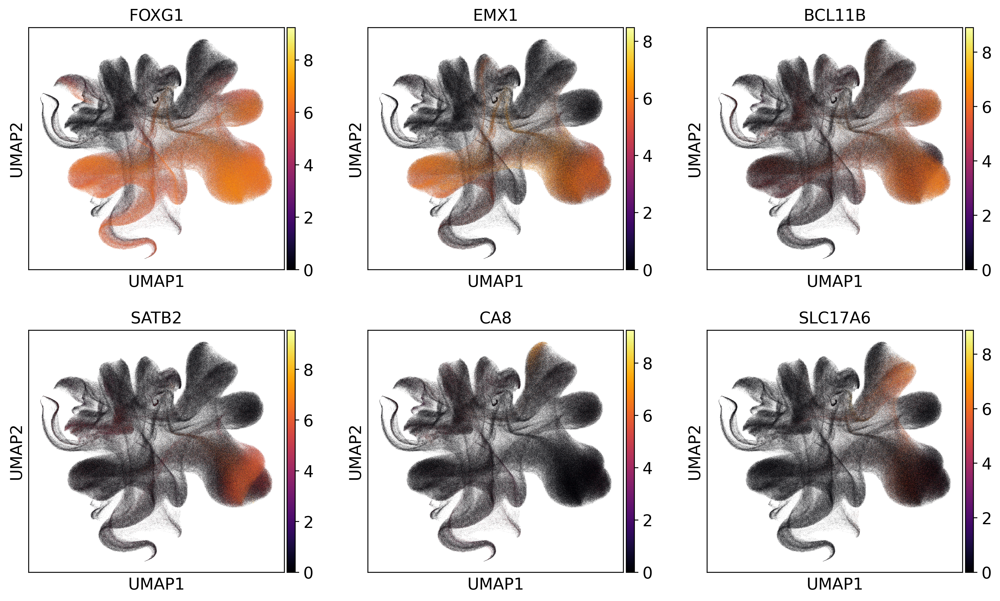

In [18]:
hnoca_adata.obsm["X_umap"] = hnoca_adata.obsm["X_umap_scpoli"].copy()
sc.pl.umap(
    hnoca_adata, 
    color=["FOXG1", "EMX1", "BCL11B", "SATB2", "CA8", "SLC17A6"],
    color_map="inferno",
    ncols=3,
)